Задание на 1ю лабу: Выполнить загрузку речевого сигнала и воспроизвести его с разными значениями частот дискретизации. 

Реализовать процедуру свёртки одномерного сигнала с импульсной характеристикой фильтра.

Проверить полученный результат с существующими реализациями свёртки, а также с теоретическим расчётом.

Выполнить моделирование процедуры реверберации звукового сигнала с «естественной» импульсным откликом произвольного помещения (Лозаннский собор, Швейцария). 

Реализовать алгоритм Карплуса–Стронга.

In [1]:
import librosa
from IPython.display import Audio

In [25]:
filename = "test1.wav"
# filename = "test.ogg"
signal, sr = librosa.load(filename)
print("частота дискретизации записи:",filename," = ", sr)

C:\ProgramData\Anaconda3\lib\site-packages\librosa\core\audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


частота дискретизации записи: test1.wav  =  22050


In [3]:
import soundfile as sf

sr2 = 16000
sf.write( 'obr_test_sr_16000.wav' , signal , sr2)

In [4]:
Audio(signal, rate=sr2)

In [5]:
sr1 = 43000
sf.write( 'obr_test_sr_23000.wav' , signal , sr1)

In [6]:
Audio(signal, rate=sr1)

# Свертка

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:17: DeprecationWarning: Numeric-style type codes are deprecated and will result in an error in the future.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:17: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


[0 0 0 ... 0 0 0]
signal_np.shape: (105370,)


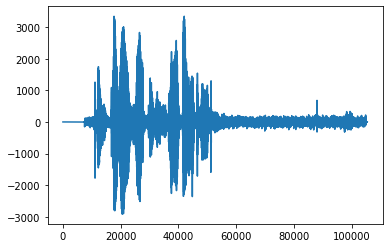

In [21]:
import wave
import sys
from scipy.io.wavfile import write
import numpy as np
import matplotlib.pyplot as plt

import soundfile as sf

filename = "test.wav"
x, sr = librosa.load(filename,sr=22050)
sf.write('tmp.wav', x, 22050)
# wave.open('tmp.wav','r')

file_w = wave.open('tmp.wav','r')
# ('test.wav', 'r')
frames_w = file_w.readframes(-1)
signal_np = np.fromstring(frames_w, 'Int16')
print(signal_np)

print('signal_np.shape:', signal_np.shape)
plt.plot(signal_np)
plt.show()

In [8]:
len_frames = len(signal_np)
print(type(signal_np))

<class 'numpy.ndarray'>


In [9]:
delta = np.array([1., 0., 0.])
avec_delta = np.convolve(signal_np, delta)

avec_delta = avec_delta.astype(np.int16)
write('avec_delta.wav', 22050, avec_delta)

b_i = np.zeros(22050)
b_i[0] = 1
b_i[5512] = 0.8
b_i[11025] = 0.6
b_i[16537] = 0.3
b_i[22049] = 0.1

out = np.convolve(signal_np, b_i)
out = out.astype(np.int16)
print(out)
write('out(b_vniz_delta(n-i)).wav', 22050, out)



[0 0 0 ... 0 0 0]


In [10]:
Audio(out, rate=22050)

# Фильтр

In [11]:
import math

n = 30
Fd = 22050
Fs = 20
Fx = 50

H = [0] * n 
H_id = [0] * n 
W = [0] * n 

#  импульсная характеристика фильтра
Fc = (Fs + Fx) / (2 * Fd)

print(Fc)

for i in range(n):
    if (i==0):
        H_id[i] = 2*math.pi*Fc
    else: 
        H_id[i] = math.sin(2*math.pi*Fc*i )/(math.pi*i)
# весовая функция Блекмена
    W[i] = 0.42 - 0.5 * math.cos((2*math.pi*i) /(n-1)) + 0.08 * math.cos((4*math.pi*i) /(n-1));
    H[i] = H_id[i] * W[i];

summa = 0
for i in range(n):
    summa +=H[i]
for i in range(n):
    H[i] = H[i]/summa
# out = np.array([])
out2 = np.zeros((len_frames))
for i in range(len_frames):
    for j in range(n-1):
        if(i-j>=0):
            out2[i]+= H[j]*signal_np[i-j]

0.0015873015873015873


In [12]:
out2 = out2.astype(np.int16)
write('out2FNC.wav', 22050, out2)

In [13]:
Audio(out2, rate=22050)

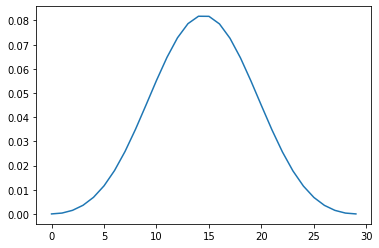

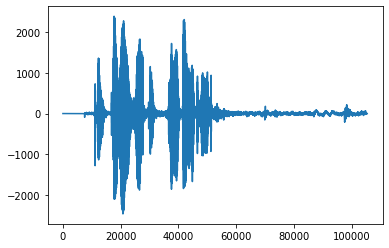

In [24]:
plt.plot(H)
plt.show()
plt.plot(out2)
plt.show()

Реверберация (от латинского re-verberatus, «повторный удар») — это процесс продолжения звучания после окончания звукового 
импульса или колебания благодаря отражениям звуковых волн от поверхностей.

Для практического измерения времени реверберации было предложено измерять время, за которое уровень затухающего (реверберирующего) сигнала уменьшается на 60 дБ. Это параметр RT60, называемый также «временем реверберации». Однако при измерении времени реверберации RT60 не учитываются частотные характеристики реверберационного отзвука.

Еще один параметр — диффузность, или спектральная неравномерность. Она определяет неравномерность АЧХ реверберации в частотной полосе в 1 Гц. Чем больше этот параметр, то есть чем более неравномерна АЧХ — тем плотнее, насыщеннее реверберационный отзвук, и тем менее он тонально окрашен. А, как известно, тональная окраска реверберации, то есть присутствие в отзвуке интонационной определенности, есть существенный недостаток помещения, делающий его непригодным для использования в музыкальных целях.

В естественной реверберации происходит сложение множества сигналов, имеющих различную задержку, поэтому количество пиков и провалов в результирующей АЧХ будет расти. В силу случайности процесса сложения пиков и провалов отдельные элементы аппроксимируются, становятся незаметными для слуха, и сам «реверберационный хвост» становится плотным и ровным.

In [14]:
filename = "test.wav"
x, sr = librosa.load(filename,sr=22050)

filename2 = "ir.wav"
x2, sr2 = librosa.load(filename2,sr=48000)


C:\ProgramData\Anaconda3\lib\site-packages\librosa\core\audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


In [15]:
# import wave
# import sys
# from scipy.io.wavfile import write
# import numpy as np
# import soundfile as sf

# filename1 = "test.wav"
# x, sr = librosa.load(filename,sr=22050)
# sf.write('tmp.wav', x, 22050)
# file_w = wave.open('tmp.wav','r')
# frames_w1 = file_w.readframes(-1)
# signal_np1 = np.fromstring(frames_w1, 'Int16')


# filename2 = "ir.wav"
# x2, sr2 = librosa.load(filename2, sr=22050)
# sf.write('tmp2.wav', x2, 22050)
# file_w2 = wave.open('tmp2.wav','r')
# frames_w2 = file_w2.readframes(-1)
# signal_np2 = np.fromstring(frames_w2, 'Int16')



# out_out = signal.convolve(signal_np1, signal_np2)
# out_out = out_out.astype(np.int16)
# write('out_out.wav', 22050, out_out)


In [16]:
# Audio(out_out, rate=22050)

In [17]:
# import wave
# import sys
# from scipy.io.wavfile import write
# import numpy as np

# import soundfile as sf

# filename = "test.wav"
# x, sr = librosa.load(filename,sr=22050)

# filename2 = "ir.wav"
# x2, sr2 = librosa.load(filename2,sr=48000)
# sf.write('tmp.wav', x2, 48000)


# file_w = wave.open('tmp.wav','r')
# frames_ir = file_w.readframes(-1)
# np_frames_ir = np.fromstring(frames_ir, 'Int16')
# out = np.convolve(signal_np, np_frames_ir)
# out = out.astype(np.int16)

In [18]:
Audio(out, rate=22050)

# Реализовать алгоритм Карплуса–Стронга.

In [19]:
import numpy as np
import scipy.io.wavfile as wave
 
sr = 22050 
l = 3          
osn_fr = 105.1
N = int(sr/osn_fr)

noise = np.random.uniform(-1, 1, N)   
print('N= ', N, 'len = ', len(noise))
data = np.zeros(sr*l)
print(len(data))

for i in range(N):
    data[i] = noise[i]
# y(n) = 0*5 (y(n-N)+y(n-N-1))     
for i in range(N, len(data)):
    data[i] = 0.5*(data[i-N]+data[i-N-1])

data = data / np.max(np.abs(data))  
print(data)
data = np.int16(data * 22050)   
# samples = samples.astype(np.int16)

wave.write("out3Gitar.wav", 22050, data)

N=  209 len =  209
66150
[-0.52826924  0.48267075  0.36100725 ... -0.07095699 -0.08316101
 -0.09420886]


In [20]:
Audio(data, rate=sr)